In [1]:
import pandas as pd
import numpy as np
from sklearn.utils import shuffle
# import re
# from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [2]:
train = shuffle(pd.read_csv('trainBal.csv'))
# validation = shuffle(pd.read_csv('validationBal.csv'))
# test = shuffle(pd.read_csv('testBal.csv'))

In [3]:
from collections import Counter

In [4]:
Counter(train['label'])

Counter({1: 32675, 0: 32675})

In [5]:
print(len(train))
# print(len(validation))
# print(len(test))

65350


In [8]:
# df = train.append(validation)
# df = df.append(test)

C:\Users\darkc\AppData\Local\Temp\ipykernel_20664\4078593904.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = train.append(validation)
C:\Users\darkc\AppData\Local\Temp\ipykernel_20664\4078593904.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(test)


In [6]:
from collections import Counter

In [7]:
Counter(train['label'])

Counter({1: 32675, 0: 32675})

In [18]:
83913 / (83913+40844)

0.6726115568665486

In [7]:
train

,Unnamed: 0,id,label,selftext,cleaned,Negative,Neutral,Positive,Compound,funct,...,wc,cleanedString,angerS,anticipation,disgust,fear,joy,sadness,surprise,trust
30778,28112,j861f7,1,Political Simulation!!!‼️‼️‼️‼️\n\nHello I jus...,"['political', 'simulation', 'hello', 'joined',...",0.000,0.811,0.189,0.8923,0.523810,...,42.0,political simulation hello joined fresh new po...,0.000000,0.250000,0.000000,0.000000,0.250000,0.000000,0.000000,0.500000
41424,45778,7aywig,1,Unless you're reading a history book.,"['unless', 'youre', 'reading', 'history', 'book']",0.000,1.000,0.000,0.0000,0.500000,...,6.0,unless youre reading history book,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
38819,61474,4ey7it,0,I was a bit surprised that the link made to Jo...,"['bit', 'surprised', 'link', 'made', 'john', '...",0.000,0.944,0.056,0.2263,0.515152,...,33.0,bit surprised link made john podesta clinton c...,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.500000,0.000000
14809,90044,5kbemg,0,\nSometimes i think that you'll never\nUnderst...,"['sometimes', 'think', 'youll', 'never', 'unde...",0.000,0.748,0.252,0.9528,0.541667,...,48.0,sometimes think youll never understand somethi...,0.000000,0.142857,0.000000,0.000000,0.428571,0.000000,0.000000,0.428571
51561,55234,cp4ht6,0,From the UK but do you know what? I hope that ...,"['uk', 'know', 'hope', 'bernie', 'win', 'elect...",0.000,0.637,0.363,0.9857,0.457627,...,59.0,uk know hope bernie win election announcement ...,0.000000,0.294118,0.000000,0.058824,0.294118,0.000000,0.176471,0.176471
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5646,104009,fc8xcj,0,"Recently, I've been blasted by near-constant s...","['recently', 'ive', 'blasted', 'nearconstant',...",0.110,0.765,0.125,0.5184,0.546559,...,247.0,recently ive blasted nearconstant social mediu...,0.157895,0.078947,0.157895,0.157895,0.131579,0.157895,0.026316,0.131579
21108,50743,7h0acl,0,Is he making them go on record to prove they w...,"['making', 'go', 'record', 'prove', 'wont', 'c...",0.104,0.810,0.086,-0.0951,0.631579,...,19.0,making go record prove wont cut benefit future,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
44362,70355,ir25of,0,How do we combat this Americanization of local...,"['combat', 'americanization', 'local', 'proble...",0.112,0.826,0.062,-0.8751,0.485981,...,214.0,combat americanization local problem indian in...,0.100000,0.100000,0.100000,0.266667,0.066667,0.166667,0.033333,0.166667
6429,42750,cstths,1,Parable of the Evil Farmers\n\n**33** “Now lis...,"['parable', 'evil', 'farmer', 'listen', 'anoth...",0.163,0.758,0.079,-0.9956,0.483444,...,453.0,parable evil farmer listen another story certa...,0.072464,0.188406,0.086957,0.144928,0.115942,0.072464,0.072464,0.246377


In [8]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import re

In [12]:
# testDF = df.head(2000)

vectorizer = CountVectorizer(strip_accents='ascii',lowercase=True,stop_words='english',max_features = 5000)
X = vectorizer.fit_transform(train['cleanedString'])
bow = pd.DataFrame(X.toarray(),columns=vectorizer.get_feature_names_out())

In [13]:
baseColumns = list(bow.columns)
filteredColumns = [x for x in baseColumns if not re.search(r'[^a-zA-Z]',x)]

In [14]:
bow[filteredColumns]

,abandon,abandoned,abc,ability,able,abolish,abolished,abolishing,abolition,abortion,...,young,younger,youre,youth,youtube,youve,zealand,zero,zone,zoning
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65345,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
65346,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
65347,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
65348,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
tfidf = TfidfVectorizer(strip_accents='ascii',lowercase=True,stop_words='english',max_features = 5000)
tfidfX = tfidf.fit_transform(train['cleanedString'])
tfidfDF = pd.DataFrame(tfidfX.toarray(),columns=tfidf.get_feature_names_out())

In [10]:
baseColumns = list(tfidfDF.columns)
filteredColumns = [x for x in baseColumns if not re.search(r'[^a-zA-Z]',x)]

In [11]:
tfidfClean = tfidfDF[filteredColumns]

In [12]:
tfidfClean

,abandon,abandoned,abc,ability,able,abolish,abolished,abolishing,abolition,abortion,...,young,younger,youre,youth,youtube,youve,zealand,zero,zone,zoning
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65345,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
65346,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
65347,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
65348,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


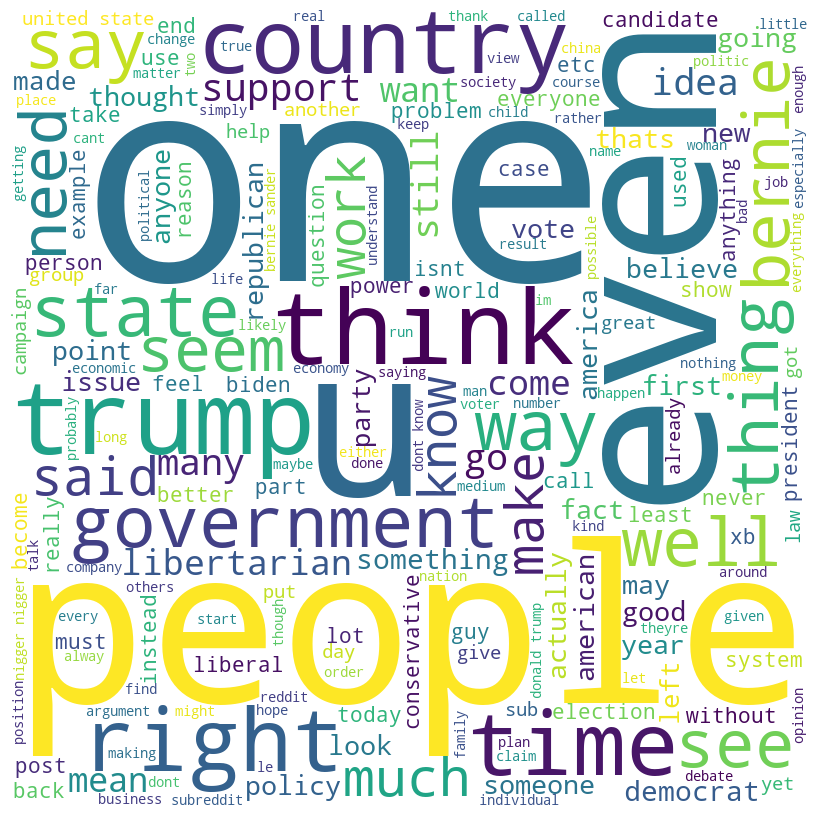

In [30]:
comment_words = ''
stopwords = set(STOPWORDS)
 
# iterate through the csv file
for val in list(train['cleanedString'].values):
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [32]:
gopTrain = train[train['label'] == 1]
demTrain = train[train['label'] == 0]

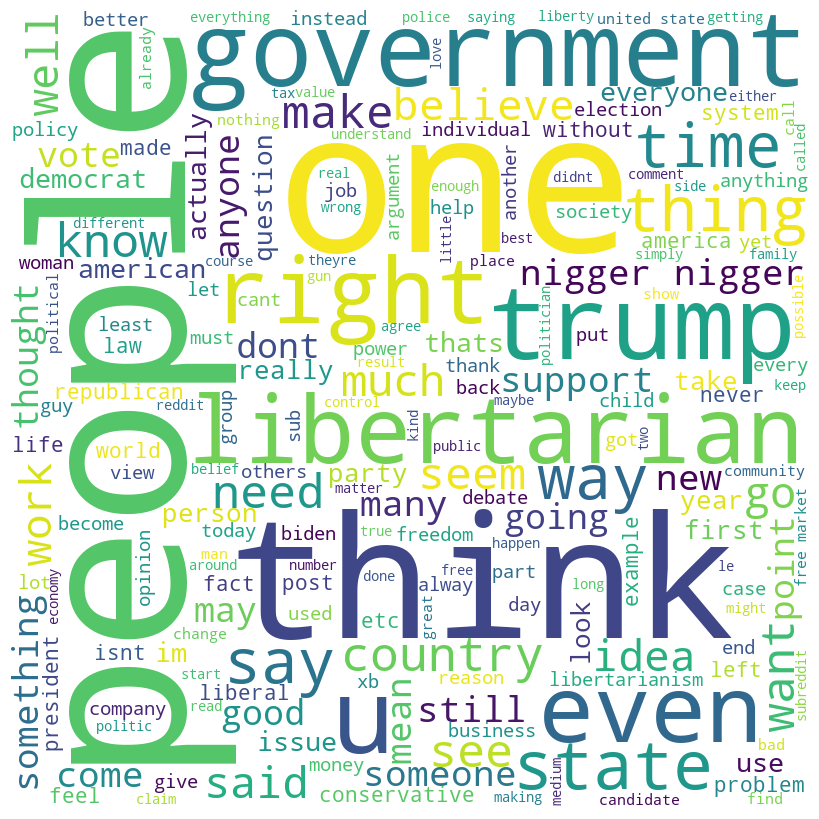

In [33]:
comment_words = ''
stopwords = set(STOPWORDS)
 
# iterate through the csv file
for val in list(gopTrain['cleanedString'].values):
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

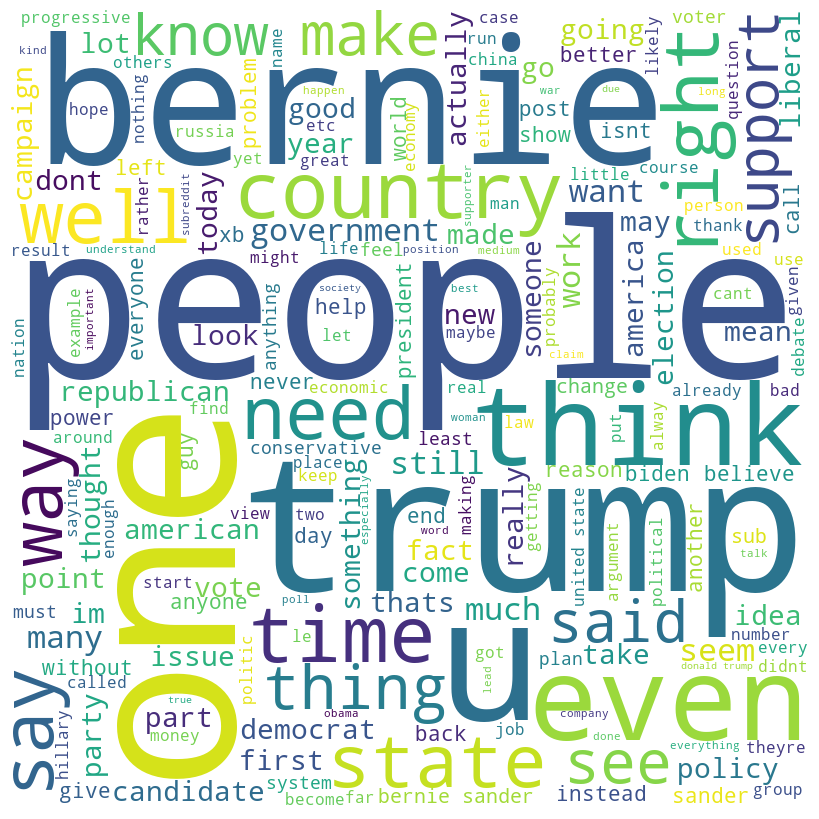

In [34]:
comment_words = ''
stopwords = set(STOPWORDS)
 
# iterate through the csv file
for val in list(demTrain['cleanedString'].values):
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [75]:
dict(Counter(comment_words.split())).keys()

dict_keys(['xb', 'movie', 'make', 'billion', 'week', 'bunch', 'nerd', 'around', 'world', 'raise', 'enough', 'money', 'recruit', 'truly', 'progressive', 'candidate', 'howard', 'dean', 'state', 'strategy', 'best', 'possible', 'route', 'congress', 'creating', 'longterm', 'familiarity', 'visibility', 'democratic', 'help', 'create', 'option', 'voting', 'booth', 'doesnt', 'even', 'much', 'sometimessouth', 'dakota', 'went', 'purple', 'obama', 'clinton', 'visited', 'couple', 'day', 'people', 'like', 'feel', 'theyre', 'instead', 'politician', 'here', 'miff', 'stick', 'craw', 'dnc', 'jack', 'shit', 'party', 'especially', 'democrat', 'red', 'without', 'major', 'funding', 'oftentimes', 'dems', 'thrown', 'bus', 'dc', 'get', 'stupid', 'situation', 'republican', 'crow', 'unanimous', 'control', 'illusion', 'impenetrable', 'superiority', 'aint', 'true', 'course', 'general', 'public', 'buy', 'home', 'south', 'generic', 'ever', 'one', 'governor', 'senator', 'impossible', 'take', 'growing', 'base', 'put',

In [65]:
strings  = " ".join(list(validation['cleanedString']))

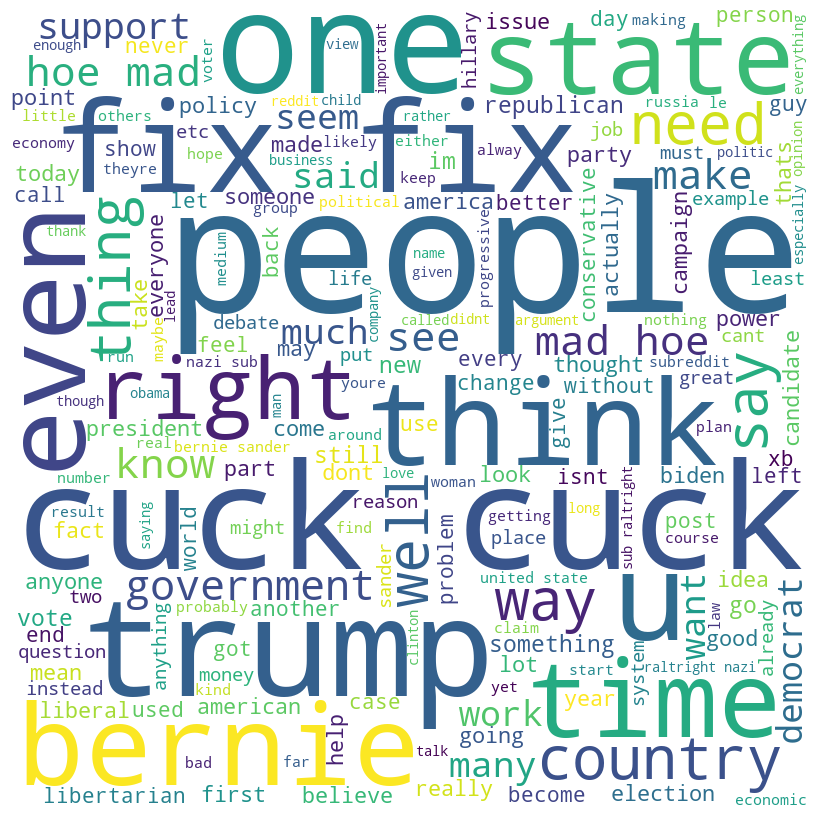

In [66]:
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(strings)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [13]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

In [14]:
tfidfClean.columns

Index(['abandon', 'abandoned', 'abc', 'ability', 'able', 'abolish',
       'abolished', 'abolishing', 'abolition', 'abortion',
       ...
       'young', 'younger', 'youre', 'youth', 'youtube', 'youve', 'zealand',
       'zero', 'zone', 'zoning'],
      dtype='object', length=4996)

In [15]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42}
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(tfidfClean)
    sse.append(kmeans.inertia_)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\Users\darkc\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3457, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\darkc\AppData\Local\Temp/ipykernel_18964/2231996765.py", line 9, in <module>
    kmeans.fit(tfidfClean)
  File "C:\Users\darkc\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py", line 1146, in fit
    self._check_params(X)
  File "C:\Users\darkc\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py", line 952, in _check_params
    self._tol = _tolerance(X, self.tol)
  File "C:\Users\darkc\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py", line 253, in _tolerance
    variances = np.var(X, axis=0)
  File "<__array_function__ internals>", line 6, in var
  File "C:\Users\darkc\AppData\Roaming\Python\Python37\site-packages\numpy\core\fromnumeric.py", line 3622, in var
    **kwargs)
  File "C:\Users\darkc\AppData\Roaming\Python\Python37\site-packages\numpy\core\_method

TypeError: object of type 'NoneType' has no len()

In [27]:
from kneed import KneeLocator

In [32]:
sse[1:]

[63247.56389186054,
 62913.90347498673,
 62576.85632903123,
 62267.648645800145,
 62072.872506004416,
 61843.590527905544,
 61737.02940738352,
 61379.46014484315,
 61261.910911553496]

In [33]:
kneedle = KneeLocator(x=(range(2, 11)), y=sse[1:], S=1.0, curve="concave", direction="increasing")

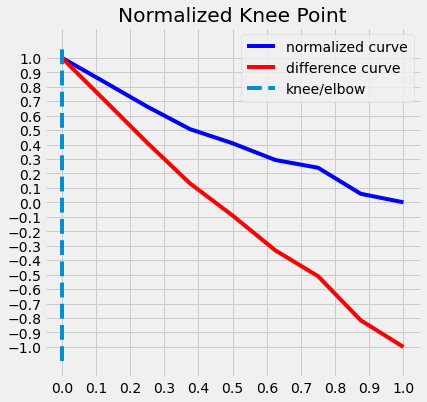

In [34]:
kneedle.plot_knee_normalized()

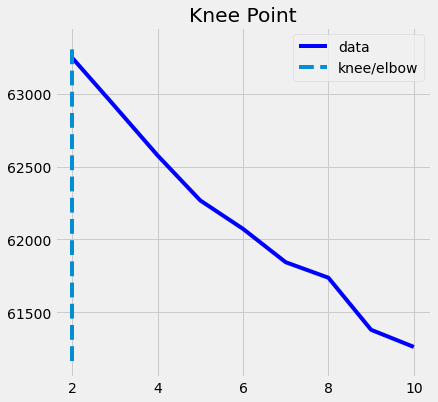

In [35]:
kneedle.plot_knee()

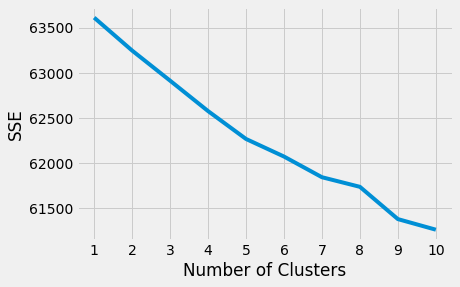

In [25]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [16]:
kmeans = KMeans(n_clusters=2, **kmeans_kwargs)
kmeans.fit(tfidfClean)

KMeans(init='random', n_clusters=2, random_state=42)

In [17]:
pred = kmeans.predict(tfidfClean)

In [18]:
train['pred'] = pred

In [19]:
import altair as alt

In [20]:
reduced_data = PCA(n_components=3).fit_transform(tfidfClean)

In [21]:
pca = pd.DataFrame(reduced_data)
pca['label'] = train['label']
pca['pred'] = pred

In [22]:
pca['dim0'] = pca[0]
pca['dim1'] = pca[1]
pca['dim2'] = pca[2]
pca = pca.drop(columns=[0,1,2])

In [23]:
alt.data_transformers.disable_max_rows()


DataTransformerRegistry.enable('default')

In [24]:
alt.Chart(pca).mark_point().encode(
    alt.X('dim0'),
    alt.Y('dim1'),
    size='dim2',
    color='label:N',
    shape='pred:N'
).properties(
    width = 600,
    height = 600
)

alt.Chart(...)

In [71]:
import jUtils

In [77]:
!pip install kmodes

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [72]:
jUtils

<module 'jUtils' from 'C:\\Users\\darkc\\Documents\\INFO 5871\\jUtils.py'>

In [73]:
jUtils.classThres(Y=train['label'],X=tfidfClean,model=km)

AttributeError: 'KMeans' object has no attribute 'predict_proba'

In [74]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

In [75]:
Y = train['label']

In [76]:
print(accuracy_score(Y, pred))
print(recall_score(Y, pred))
print(precision_score(Y, pred))

0.49745983167559293
0.007528691660290742
0.3738601823708207


In [79]:
train.columns

Index(['Unnamed: 0', 'id', 'label', 'selftext', 'cleaned', 'Negative',
       'Neutral', 'Positive', 'Compound', 'funct', 'pronoun', 'ppron', 'i',
       'we', 'you', 'shehe', 'they', 'ipron', 'article', 'verb', 'auxverb',
       'past', 'present', 'future', 'adverb', 'preps', 'conj', 'negate',
       'quant', 'number', 'swear', 'social', 'family', 'friend', 'humans',
       'affect', 'posemo', 'negemo', 'anx', 'anger', 'sad', 'cogmech',
       'insight', 'cause', 'discrep', 'tentat', 'certain', 'inhib', 'incl',
       'excl', 'percept', 'see', 'hear', 'feel', 'bio', 'body', 'health',
       'sexual', 'ingest', 'relativ', 'motion', 'space', 'time', 'work',
       'achieve', 'leisure', 'home', 'money', 'relig', 'death', 'assent',
       'nonfl', 'filler', 'wc', 'cleanedString', 'angerS', 'anticipation',
       'disgust', 'fear', 'joy', 'sadness', 'surprise', 'trust', 'pred'],
      dtype='object')

In [27]:
features = list(train.columns)[8:]
features

['Compound',
 'funct',
 'pronoun',
 'ppron',
 'i',
 'we',
 'you',
 'shehe',
 'they',
 'ipron',
 'article',
 'verb',
 'auxverb',
 'past',
 'present',
 'future',
 'adverb',
 'preps',
 'conj',
 'negate',
 'quant',
 'number',
 'swear',
 'social',
 'family',
 'friend',
 'humans',
 'affect',
 'posemo',
 'negemo',
 'anx',
 'anger',
 'sad',
 'cogmech',
 'insight',
 'cause',
 'discrep',
 'tentat',
 'certain',
 'inhib',
 'incl',
 'excl',
 'percept',
 'see',
 'hear',
 'feel',
 'bio',
 'body',
 'health',
 'sexual',
 'ingest',
 'relativ',
 'motion',
 'space',
 'time',
 'work',
 'achieve',
 'leisure',
 'home',
 'money',
 'relig',
 'death',
 'assent',
 'nonfl',
 'filler',
 'wc',
 'cleanedString',
 'angerS',
 'anticipation',
 'disgust',
 'fear',
 'joy',
 'sadness',
 'surprise',
 'trust',
 'pred']

positive sentiment: compound score >= 0.05
neutral sentiment: (compound score > -0.05) and (compound score < 0.05)
negative sentiment: compound score <= -0.05

In [126]:
import pandas as pd
import numpy as np
import math


In [127]:
train.isnull().values.any()

False

In [28]:
discTrain = pd.DataFrame()
for i in features:
    print(discTrain.isnull().values.any())
    print(i)
    print(max(train[i]))
    print(min(train[i]))
    if i == 'Compound':
        discTrain[i] = pd.cut(train[i],bins=[-1.5,-0.05,0.05,1.5],
       labels=["Negative", "Neutral", "Positive"])
    elif i == 'wc':
        discTrain[i] = pd.cut(train[i],bins=3,
       labels=["Low", "Mid", "High"])
    elif i == 'cleanedString' or i == 'pred':
        pass
    else:
        nLabel = "not"+str(i)
        discTrain[i] = pd.cut(train[i],bins=[-0.5,0.0,1.5],
       labels=[nLabel, str(i)])
        
        

False
Compound
1.0
-1.0
False
funct
1.0
0.0
False
pronoun
1.0
0.0
False
ppron
0.6666666666666666
0.0
False
i
0.5
0.0
False
we
0.5
0.0
False
you
0.5
0.0
False
shehe
0.5
0.0
False
they
0.5
0.0
False
ipron
1.0
0.0
False
article
0.7397260273972602
0.0
False
verb
1.0
0.0
False
auxverb
0.6666666666666666
0.0
False
past
0.5
0.0
False
present
1.0
0.0
False
future
0.3333333333333333
0.0
False
adverb
1.0
0.0
False
preps
1.0
0.0
False
conj
0.6
0.0
False
negate
1.0
0.0
False
quant
1.0
0.0
False
number
0.6666666666666666
0.0
False
swear
1.0
0.0
False
social
1.0
0.0
False
family
1.0
0.0
False
friend
0.3333333333333333
0.0
False
humans
0.5
0.0
False
affect
1.0
0.0
False
posemo
1.0
0.0
False
negemo
1.0
0.0
False
anx
1.0
0.0
False
anger
1.0
0.0
False
sad
1.0
0.0
False
cogmech
1.0
0.0
False
insight
1.0
0.0
False
cause
1.0
0.0
False
discrep
0.5
0.0
False
tentat
1.0
0.0
False
certain
1.0
0.0
False
inhib
1.0
0.0
False
incl
0.5
0.0
False
excl
0.6666666666666666
0.0
False
percept
1.0
0.0
False
see
0.66666666

In [29]:
discTrain.isnull().values.any()

False

In [30]:
from kmodes.kmodes import KModes

In [31]:
train[features]

,Compound,funct,pronoun,ppron,i,we,you,shehe,they,ipron,...,cleanedString,angerS,anticipation,disgust,fear,joy,sadness,surprise,trust,pred
25281,-0.6004,0.617647,0.220588,0.147059,0.117647,0.000000,0.000000,0.029412,0.000000,0.073529,...,take nap seriously strive live life even tho t...,0.142857,0.142857,0.000,0.285714,0.285714,0.000000,0.000000,0.142857,1
64285,0.9370,0.472222,0.111111,0.013889,0.000000,0.000000,0.000000,0.013889,0.000000,0.097222,...,biden keep complaining tax go richest people m...,0.000000,0.000000,0.000,0.000000,0.000000,0.500000,0.000000,0.500000,0
43654,-0.7717,0.500000,0.155172,0.103448,0.034483,0.000000,0.000000,0.034483,0.034483,0.051724,...,point number keep seeing medium annoys identit...,0.181818,0.181818,0.000,0.090909,0.181818,0.090909,0.000000,0.272727,1
3121,0.7937,0.523077,0.107692,0.046154,0.030769,0.000000,0.015385,0.000000,0.000000,0.061538,...,libertarian think id electoral college say gre...,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,1.000000,1
55596,0.8366,0.597122,0.158273,0.086331,0.014388,0.000000,0.014388,0.057554,0.000000,0.071942,...,think controversy one rare example congressman...,0.133333,0.266667,0.000,0.000000,0.133333,0.066667,0.066667,0.333333,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10407,0.4627,0.590909,0.204545,0.181818,0.136364,0.000000,0.000000,0.045455,0.000000,0.022727,...,get hate supporting trump love show support ev...,0.125000,0.000000,0.125,0.125000,0.125000,0.125000,0.125000,0.250000,0
35760,-0.9074,0.545455,0.068182,0.022727,0.022727,0.000000,0.000000,0.000000,0.000000,0.045455,...,look around reddit around really anywhere onli...,0.250000,0.000000,0.500,0.000000,0.000000,0.000000,0.000000,0.250000,1
40237,0.3447,0.548387,0.193548,0.161290,0.032258,0.032258,0.032258,0.064516,0.000000,0.032258,...,unless captured word president elect he war he...,0.000000,0.125000,0.000,0.125000,0.125000,0.000000,0.125000,0.500000,1
22853,-0.4246,0.416667,0.083333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.083333,...,smug berners lame clip art btw,0.000000,0.250000,0.000,0.000000,0.250000,0.250000,0.250000,0.000000,1


In [32]:
discTrain

,Compound,funct,pronoun,ppron,i,we,you,shehe,they,ipron,...,filler,wc,angerS,anticipation,disgust,fear,joy,sadness,surprise,trust
25281,Negative,funct,pronoun,ppron,i,notwe,notyou,shehe,notthey,ipron,...,notfiller,Low,angerS,anticipation,notdisgust,fear,joy,notsadness,notsurprise,trust
64285,Positive,funct,pronoun,ppron,noti,notwe,notyou,shehe,notthey,ipron,...,notfiller,Low,notangerS,notanticipation,notdisgust,notfear,notjoy,sadness,notsurprise,trust
43654,Negative,funct,pronoun,ppron,i,notwe,notyou,shehe,they,ipron,...,notfiller,Low,angerS,anticipation,notdisgust,fear,joy,sadness,notsurprise,trust
3121,Positive,funct,pronoun,ppron,i,notwe,you,notshehe,notthey,ipron,...,notfiller,Low,notangerS,notanticipation,notdisgust,notfear,notjoy,notsadness,notsurprise,trust
55596,Positive,funct,pronoun,ppron,i,notwe,you,shehe,notthey,ipron,...,notfiller,Low,angerS,anticipation,notdisgust,notfear,joy,sadness,surprise,trust
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10407,Positive,funct,pronoun,ppron,i,notwe,notyou,shehe,notthey,ipron,...,notfiller,Low,angerS,notanticipation,disgust,fear,joy,sadness,surprise,trust
35760,Negative,funct,pronoun,ppron,i,notwe,notyou,notshehe,notthey,ipron,...,notfiller,Low,angerS,notanticipation,disgust,notfear,notjoy,notsadness,notsurprise,trust
40237,Positive,funct,pronoun,ppron,i,we,you,shehe,notthey,ipron,...,notfiller,Low,notangerS,anticipation,notdisgust,fear,joy,notsadness,surprise,trust
22853,Negative,funct,pronoun,notppron,noti,notwe,notyou,notshehe,notthey,ipron,...,notfiller,Low,notangerS,anticipation,notdisgust,notfear,joy,sadness,surprise,nottrust


In [33]:
kmode = KModes(n_clusters=2, init = "random", n_init = 5, verbose=1)
clusters = kmode.fit_predict(discTrain)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 6642, cost: 972851.0
Run 1, iteration: 2/100, moves: 383, cost: 972851.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 13390, cost: 980082.0
Run 2, iteration: 2/100, moves: 4433, cost: 974509.0
Run 2, iteration: 3/100, moves: 854, cost: 974509.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 18004, cost: 980082.0
Run 3, iteration: 2/100, moves: 5912, cost: 973035.0
Run 3, iteration: 3/100, moves: 1907, cost: 972117.0
Run 3, iteration: 4/100, moves: 138, cost: 972117.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 6900, cost: 971751.0
Run 4, iteration: 2/100, moves: 1021, cost: 971751.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 

In [35]:
reduced_data = PCA(n_components=3).fit_transform(train[features].drop(columns=['cleanedString','pred']))
pca = pd.DataFrame(reduced_data)
pca['label'] = train['label']
pca['pred'] = clusters
pca['dim0'] = pca[0]
pca['dim1'] = pca[1]
pca['dim2'] = pca[2]
pca = pca.drop(columns=[0,1,2])

In [36]:
alt.Chart(pca).mark_point().encode(
    alt.X('dim0'),
    alt.Y('dim1'),
    size='dim2',
    color='label:N',
    shape='pred:N'
).properties(
    width = 600,
    height = 600
)

alt.Chart(...)